<a href="https://colab.research.google.com/github/HelliosClub/YOLOv5_PJT/blob/main/YOLOv5_Parking-lot_PJT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install -q roboflow
!git clone https://github.com/ultralytics/yolov5  # YOLOv5 레퍼지토리 clone
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.4/85.4 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 4.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 46.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 107.0 MB/s eta 0:00:00
Cloning into 'yolov5'...
remote: Enumerating objects: 17483, done.
remote: Total 17483 (delta 0), reused 0 (delta 0), pack-reused 17483 (from 1)
Receiving objects: 100% (17483/17483), 16.53 MiB | 30.50 MiB/s, done.
Resolving deltas: 100% (11988/11988), done.
/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 128.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 102.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 61.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.7 MB/s eta 0:00:00
   ━━━━━━━━

In [2]:
import os
import glob
from getpass import getpass
from roboflow import Roboflow
import torch
import yaml
from IPython.display import Image, display, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Setup complete. Using torch 2.6.0+cu124 (NVIDIA A100-SXM4-40GB)


In [3]:
pip install inference-sdk

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.3/43.3 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 25.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.5/62.5 MB 39.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 181.5/181.5 kB 16.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.9/50.9 kB 4.7 MB/s eta 0:00:00
  Attempting uninstall: opencv-python
    Found existing installation: opencv-python 4.11.0.86
    Uninstalling opencv-python-4.11.0.86:
      Successfully uninstalled opencv-python-4.11.0.86
  Attempting uninstall: aiohttp
    Found existing installation: aiohttp 3.11.15
    Uninstalling aiohttp-3.11.15:
      Successfully uninstalled aiohttp-3.11.15


In [4]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="HQuCBHwLLWUYWpXeqvhY")
project = rf.workspace("heliosclub").project("parking-space-ipm1b-403l9")
version = project.version(1)
dataset = version.download("yolov5")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Parking-Space-1 in yolov5pytorch:: 100%|██████████| 6257/6257 [00:02<00:00, 2896.79it/s]


In [5]:
data_dir = '/content/yolov5/Parking-Space-1'
data_yaml = '/content/yolov5/Parking-Space-1/data.yaml'

assert (os.path.exists(data_dir)) and (os.path.exists(data_yaml))

In [6]:
with open(data_yaml) as f:
    film = yaml.load(f, Loader=yaml.FullLoader)
    display(film)

{'names': ['empty', 'occupied'],
 'nc': 2,
 'roboflow': {'license': 'CC BY 4.0',
  'project': 'parking-space-ipm1b-403l9',
  'url': 'https://app.roboflow.com/heliosclub/parking-space-ipm1b-403l9/1',
  'version': 1,
  'workspace': 'heliosclub'},
 'test': '../test/images',
 'train': 'Parking-Space-1/train/images',
 'val': 'Parking-Space-1/valid/images'}

In [7]:
film['train'] = os.path.join(data_dir, 'train/images')
film['val'] = os.path.join(data_dir, 'test/images')

In [8]:
!python train.py --img 416 --batch 16 --epochs 50 --data {data_yaml} --weights yolov5s.pt --cache

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
  with torch.cuda.amp.autocast(amp):
      33/49      2.34G    0.03621    0.07674   0.003138        721        416:  33% 48/147 [00:03<00:07, 13.17it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      33/49      2.34G    0.03613    0.07676   0.003123        652        416:  33% 48/147 [00:03<00:07, 13.17it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      33/49      2.34G    0.03606    0.07642   0.003106        391        416:  34% 50/147 [00:03<00:07, 13.54it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      33/49 

In [9]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [10]:
train_path = '/content/yolov5/runs/train'
train_folders = [folder for folder in os.listdir(train_path) if os.path.isdir(os.path.join(train_path, folder))]
print(f'Training exp 폴더: {train_folders}')

Training exp 폴더: ['exp']


In [11]:
# 테스트 이미지 경로
test_data_dir = film['val']

# 학습 결과가 저장된 폴더 지정
# 위 코드 블럭에서 진행한 실험이 저장된 폴더 확인 후 기입 (e.g. 'exp' or 'exp1' or ...)
training_folder = 'exp'

In [21]:
# 느낌표(!)를 사용한 셀 명령어
!python detect.py --weights runs/train/{training_folder}/weights/best.pt --img 416 --conf 0.1 --source {test_data_dir}

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/yolov5/Parking-Space-1/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-419-gcd44191c Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)

Fusing layers... 
Model summary: 157 layers, 7015519 parameters, 0 gradients, 15.8 GFLOPs
image 1/226 /content/yolov5/Parking-Space-1/test/images/00000301_jpg.rf.f5774c7e1889fd281c3972484c9d1027.jpg: 416x416 6 occupieds, 7.5ms
image 2/226 /content/yolov5/Parking-Space-1/test/images/002_20220315_174541-mp4_20220318_114126-099_jpg.rf.db6ab9684cdf460b23bd1bb906454a7a.j

In [24]:
test_path = '/content/yolov5/runs/detect'
test_folders = [folder for folder in os.listdir(test_path) if os.path.isdir(os.path.join(test_path, folder))]
print(f'테스트 결과 폴더: {test_folders}')


테스트 결과 폴더: ['exp', 'exp2']


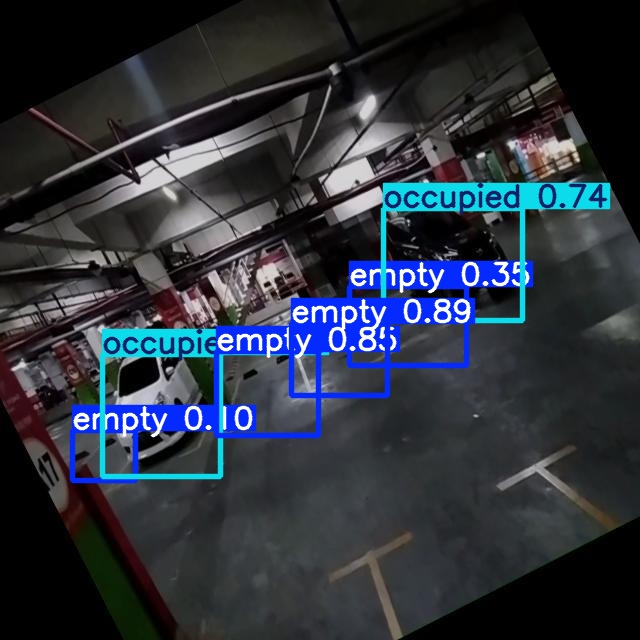

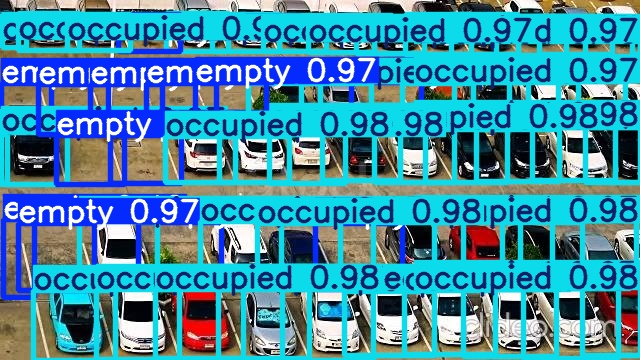

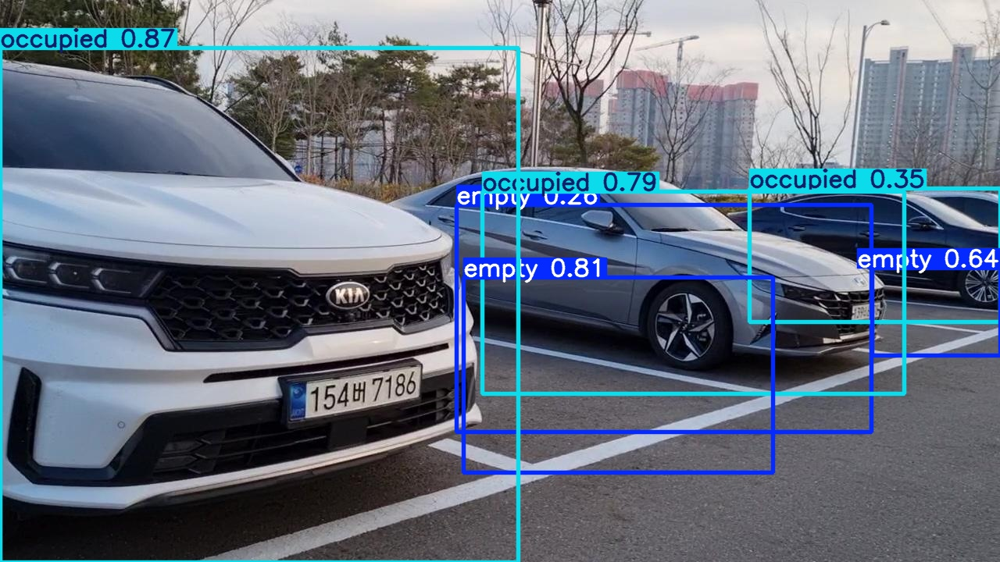

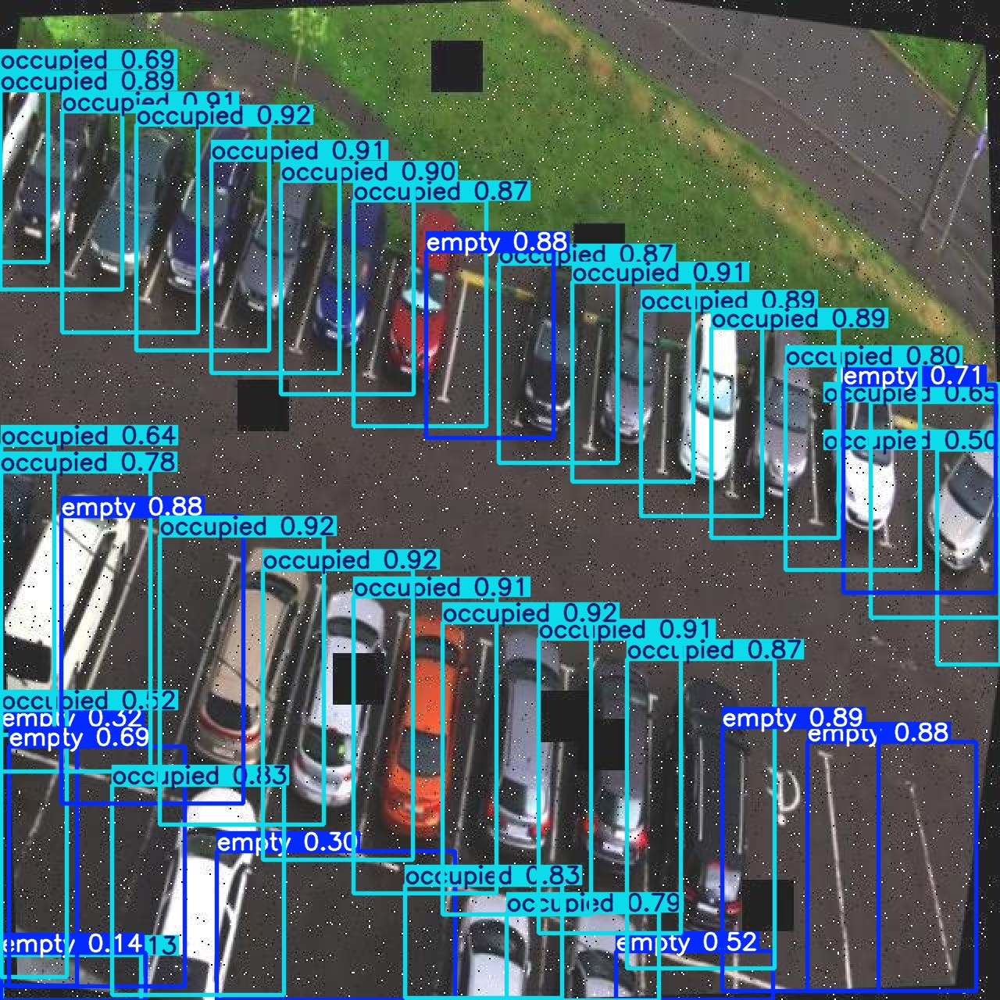

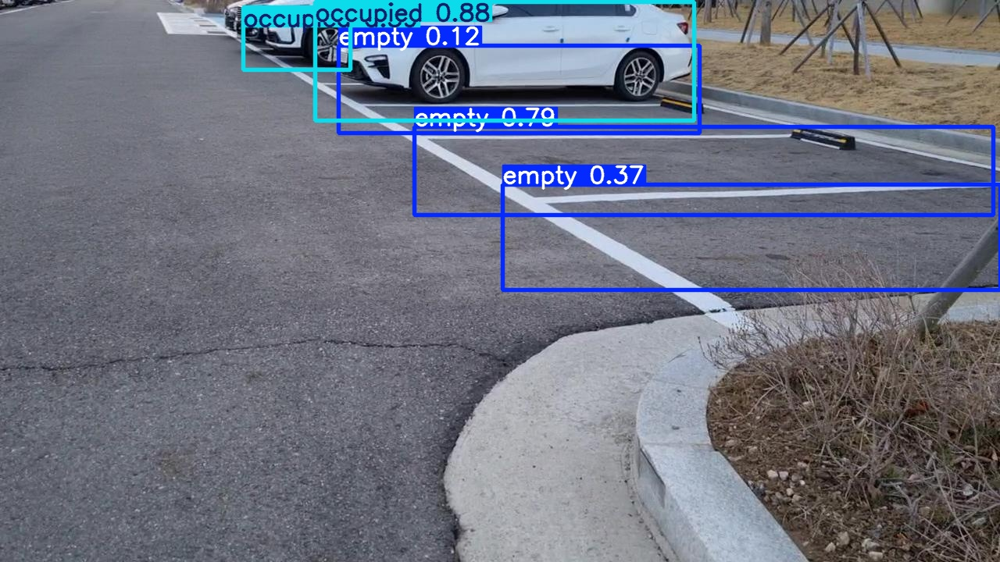

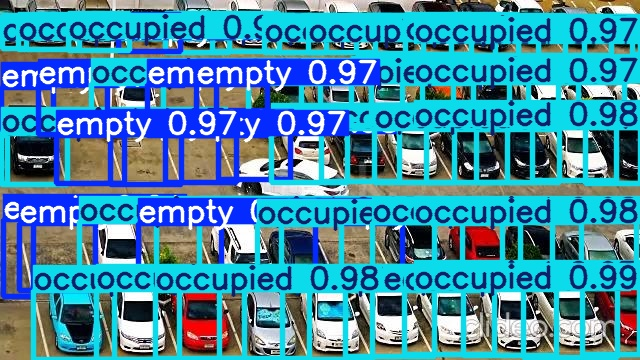

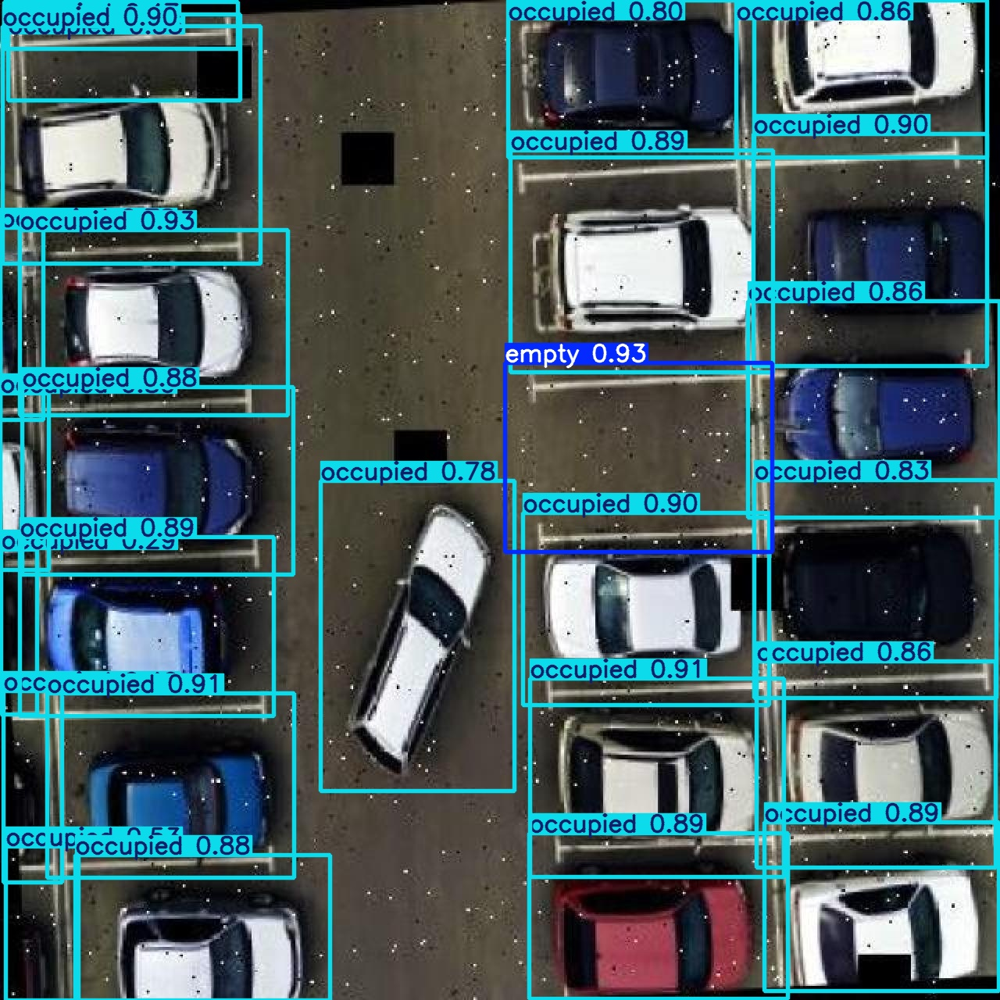

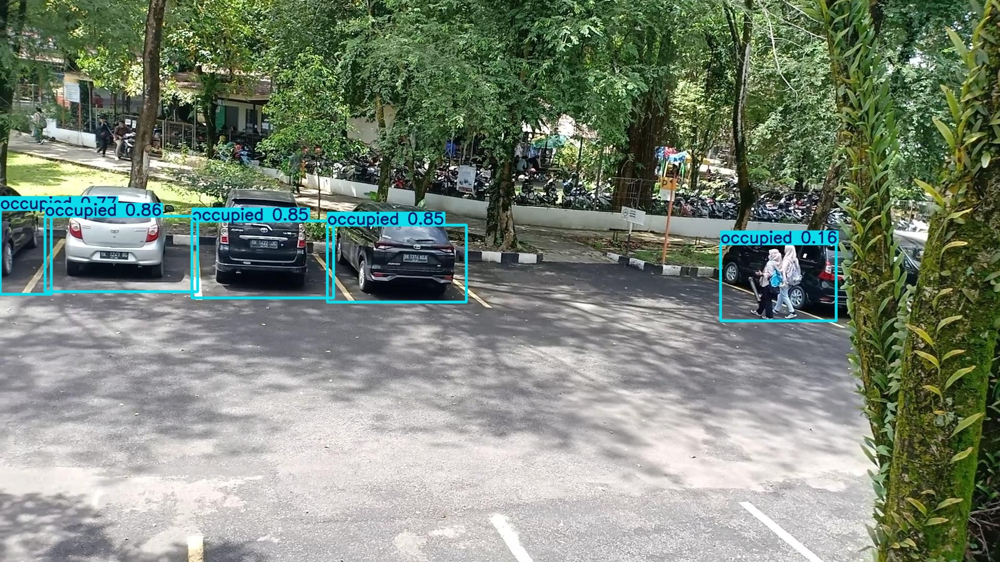

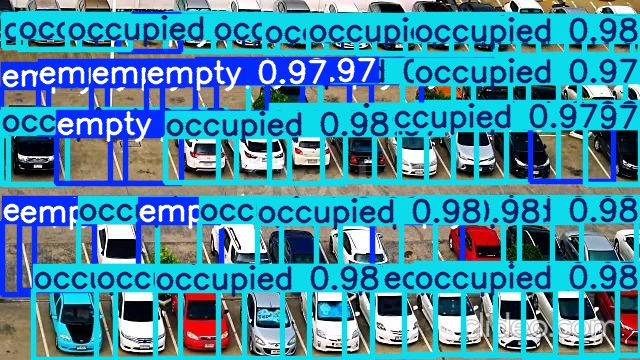

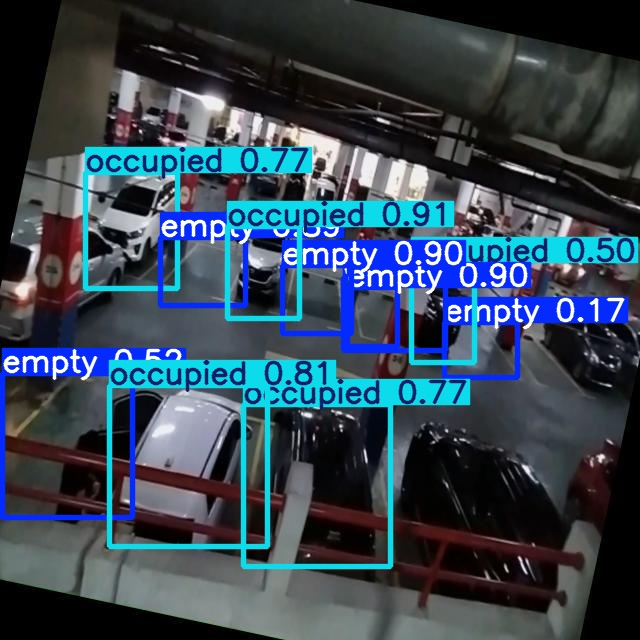

In [26]:
test_exp_folder = 'exp2'
assert os.path.exists(os.path.join(test_path, test_exp_folder))

image_files = glob.glob(os.path.join(test_path, test_exp_folder + '/*.jpg'))

for imageName in image_files[:10]:
    display(Image(filename=imageName))
    print("\n")